# Capstone Project - Restaurant Opening New York
### Applied Data Science Capstone for IBM/Coursera by Sujoy Mukherjee

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)
* [Appendix](#appendix)

## Introduction <a name="introduction"></a>

For this endavour, we are trying to find an optimal location for a restaurant in **New York** and also help the person chose the **cuisine**.

We will use the data science algorithims learned to generate  promissing neighborhoods based on this criteria. 

## Data <a name="data"></a>

Based on definition of our problem, factors that will influence our decission are:

* Population profile 
* number of existing restaurants in the **Target Market**.
* Location
 - Where 
 - Parking  lots locations 
 - Visibility

Following data sources will be used to extract/generate the required information:
* https://data.cityofnewyork.us/Health/DOHMH-New-York-City-Restaurant-Inspection-Results/rs6k-p7g6
* https://geo.nyu.edu/catalog/nyu_2451_34572
* https://data.cityofnewyork.us/City-Government/Zoning-GIS-Data-Shapefile/kdig-pewd
* https://data.cityofnewyork.us/City-Government/Parking-Lots/e2f7-cs7i
* https://data.cityofnewyork.us/Business/parking-garage-list/5bhr-pjxt
* https://en.wikipedia.org/wiki/Economy_of_New_York_City
* https://en.wikipedia.org/wiki/Cuisine_of_New_York_City



### Target Market

* You might assume that you know enough about a particular location if you're opening in your own hometown or a local neighbourhood. You might think that doing any further research is unnecessary. This can be a costly mistake.
* Really digging into the numbers in your area, from housing values, average household income to average age, then contrasting this information with the number of competing restaurants in the area, will help you determine the best type of restaurant to open.
* You might tailor your concept to customers between 15 to 44 years


In [17]:
import pandas as pd 
# import wikipedia as wp
# from bs4 import BeautifulSoup
import folium
from folium import plugins
from folium.plugins import HeatMap
import json
from pandas.io.json import json_normalize 
# !pip install pyproj
import pyproj
from geopy.geocoders import Nominatim
from geopy.distance import geodesic

#### Boroughs
New York City encompasses five county-level administrative divisions called boroughs: The Bronx, Brooklyn, Manhattan, Queens, and Staten Island. Each borough is coterminous with a respective county of New York State. The boroughs of Queens and the Bronx are concurrent with the counties of the same name, while the boroughs of Manhattan, Brooklyn, and Staten Island correspond to New York, Kings, and Richmond counties, respectively.

All five boroughs came into existence with the consolidation of New York City in 1898, when New York County, Kings County, Queens County, and Richmond County consolidated into one municipal government. The former municipalities in Kings, Richmond, and most of Queens counties were abolished, though the counties themselves were retained. However, the five boroughs have not always been coextensive with their five respective counties. 

https://en.m.wikipedia.org/wiki/Boroughs_of_New_York_City

In [2]:
dfBoroughs=pd.read_json('Borough Boundaries.geojson')
dfBoroughs = json_normalize(dfBoroughs['features']).rename(columns={"properties.boro_code": "code", "properties.boro_name": "name"})
dfBoroughs[['code','name']]

,code,name
0,2,Bronx
1,5,Staten Island
2,3,Brooklyn
3,4,Queens
4,1,Manhattan


In [3]:
geo_json_data=json.load(open('Borough Boundaries.geojson'))
m = folium.Map([40.730610, -73.935242], tiles='cartodbpositron',zoom_start=10)
# folium.GeoJson(geo_json_data).add_to(m)
choropleth =folium.Choropleth(geo_data=geo_json_data,
                                columns=['code',
                                'name'],
                                key_on='name',
                                fill_color='YlGn',
                                fill_opacity=0.7,
                                line_opacity=0.2,
                                highlight=True).add_to(m)
display(m)

#### Community Districts

The community boards of the New York City government are the appointed advisory groups of the community districts of the five boroughs. There are currently 59 community districts: twelve in Manhattan, twelve in the Bronx, eighteen in Brooklyn, fourteen in Queens, and three in Staten Island:

    Community boards of Manhattan
    Community boards of the Bronx
    Community boards of Brooklyn
    Community boards of Queens
    Community boards of Staten Island

They advise on land use and zoning, participate in the city budget process, and address service delivery in their district. Regarding land use they are only advisory and mostly serve as mobilizing institutions for communities opposed to specific projects. The City Charter also allows boards to submit their own plans for the development, growth, and improvement of their communities.

https://en.wikipedia.org/wiki/Community_boards_of_New_York_City

In [4]:
dfCommDistricts=pd.read_json('Community Districts.geojson')
dfCommDistricts.head()
# df['features'].to_json()

,type,features
0,FeatureCollection,"{'type': 'Feature', 'properties': {'boro_cd': ..."
1,FeatureCollection,"{'type': 'Feature', 'properties': {'boro_cd': ..."
2,FeatureCollection,"{'type': 'Feature', 'properties': {'boro_cd': ..."
3,FeatureCollection,"{'type': 'Feature', 'properties': {'boro_cd': ..."
4,FeatureCollection,"{'type': 'Feature', 'properties': {'boro_cd': ..."


In [5]:
dfCommDistricts1 = json_normalize(dfCommDistricts['features']) 
dfCommDistricts1
dfCommDistricts1.sort_values('properties.boro_cd')

,type,properties.boro_cd,properties.shape_area,properties.shape_leng,geometry.type,geometry.coordinates
29,Feature,101,42686588.7045,73762.3932195,MultiPolygon,"[[[[-74.0438776163991, 40.69018767537123], [-7..."
46,Feature,102,37689212.482,34130.5958612,MultiPolygon,"[[[[-73.9968399392649, 40.7373608893982], [-73..."
45,Feature,103,46879700.6165,30468.3406004,MultiPolygon,"[[[[-73.98877931684083, 40.7339653992359], [-7..."
47,Feature,104,49311794.0367,67623.9466839,MultiPolygon,"[[[[-73.99393694248319, 40.77317951096692], [-..."
19,Feature,105,43790297.6846,35288.3052001,MultiPolygon,"[[[[-73.97301487176121, 40.76427887944521], [-..."
...,...,...,...,...,...,...
53,Feature,484,123780064.14,247815.353417,MultiPolygon,"[[[[-73.93176252156162, 40.55787963804195], [-..."
39,Feature,501,376945329.346,158002.195321,MultiPolygon,"[[[[-74.15945602438185, 40.641448333324036], [..."
69,Feature,502,593198080.456,142669.72448,MultiPolygon,"[[[[-74.07346627066256, 40.57838568589738], [-..."
56,Feature,503,599062130.009,189000.708091,MultiPolygon,"[[[[-74.13319580101383, 40.536306742050584], [..."


In [6]:
geo_json_data=json.load(open('Community Districts.geojson'))
# m = folium.Map([40.730610, -73.935242], zoom_start=11)
folium.GeoJson(geo_json_data).add_to(m)
display(m)


#### Zoning 
Zoning is the language of the physical city. It aims to promote an orderly pattern of development and to separate incompatible land uses, such as industrial uses and homes, to ensure a pleasant environment. The Zoning Resolution is a legal instrument to regulate and establish limits on the use of land and building size, shape, height, and setback.

The current Zoning Resolution was adopted on December 15, 1961 to apply citywide. When changing conditions warrant them, periodic updates and amendments are made to maintain a rational use of land. Each plot of land within the City’s jurisdiction has a zoning designation — residence, commercial, or manufacturing—to establish relevant parameters for building and land use. Numerous zoning districts are mapped in the City’s diverse neighborhoods to preserve their varying density and character. These limits help give shape to neighborhoods and predictability to their future. The City continues to adapt the Zoning Resolution as the land use patterns in the City change through private and public actions.

https://www1.nyc.gov/site/planning/zoning/about-zoning.page

In [ ]:
geo_json_data=json.load(open('Zoning GIS Data_ Shapefile.geojson'))
# m = folium.Map([40.730610, -73.935242], zoom_start=11,tiles = 'Cartodb Positron',fill_color='YlOrRd', fill_opacity=0.7, line_opacity=0.3)

folium.GeoJson(geo_json_data).add_to(m)

m

In [ ]:
dfZoning=pd.read_json('Zoning GIS Data_ Shapefile.geojson')
dfZoning.head()
dfZoning1 = json_normalize(dfZoning['features']) 
dfZoning1

#### Restaurants
For getting a list of Restaurants, there are multiple options and sources available on the net including using FourSquare APIs. I decided to infer the Restaurant data from NYC OpenData available for inspections. Since  inspections are very thorough and regular, it would cover most of the restaurants. 

This list can also be used at a later stage to gain more insights into the targetted locality to figure out additional details.

In [7]:
dfRestaurants=pd.read_csv('DOHMH_New_York_City_Restaurant_Inspection_Results.csv')
dfRestaurants.sort_values('CAMIS', inplace= True)
dfRestaurants.drop_duplicates(subset='CAMIS',inplace=True)
dfRestaurants.dropna(inplace=True)
dfRestaurants.reset_index(inplace=True,drop= True) # Reset the index after all the cleaning and also dont add the old index as a column(drop=true)
dfRestaurants

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,30075445,MORRIS PARK BAKE SHOP,Bronx,1007,MORRIS PARK AVE,10462.0,7188924968,Bakery,06/11/2019,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Re-inspection,40.848231,-73.855972,211.0,13.0,25200.0,2045445.0,2.041270e+09,BX37
1,30112340,WENDY'S,Brooklyn,469,FLATBUSH AVENUE,11225.0,7182875005,Hamburgers,03/13/2018,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.662652,-73.962081,309.0,40.0,32700.0,3029737.0,3.011970e+09,BK60
2,30191841,DJ REYNOLDS PUB AND RESTAURANT,Manhattan,351,WEST 57 STREET,10019.0,2122452912,Irish,12/14/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Re-inspection,40.767326,-73.984310,104.0,3.0,13900.0,1026048.0,1.010480e+09,MN15
3,40356018,RIVIERA CATERERS,Brooklyn,2780,STILLWELL AVENUE,11224.0,7183723031,American,07/20/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.579920,-73.982090,313.0,47.0,34800.0,3347399.0,3.069970e+09,BK21
4,40356483,WILKEN'S FINE FOOD,Brooklyn,7114,AVENUE U,11234.0,7184443838,Delicatessen,06/03/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.620112,-73.906989,318.0,46.0,70000.0,3237693.0,3.084310e+09,BK45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14754,50099683,KRISPY KRUNCHY CHICKEN,Queens,17933,HILLSIDE AVE,11432.0,3475619139,American,11/04/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.712768,-73.783322,408.0,24.0,46600.0,4212923.0,4.099370e+09,QN06
14755,50099713,HEALTHY GREEN GOURMET DELI,Manhattan,48,3RD AVE,10003.0,2123532110,Other,11/07/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.730810,-73.988995,103.0,2.0,4200.0,1008975.0,1.005560e+09,MN22
14756,50099781,NAPOLI PIZZA,Staten Island,1206,VICTORY BLVD,10301.0,7187275353,Pizza,10/24/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.616271,-74.103807,501.0,49.0,16901.0,5157967.0,5.006510e+09,SI07
14757,50099785,Montanita Restaurant,Queens,10014,NORTHERN BLVD,11368.0,7184464622,"Latin (Cuban, Dominican, Puerto Rican, South &...",10/31/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.757348,-73.868225,403.0,21.0,37700.0,4042513.0,4.017150e+09,QN26


Group the restaurants and count by the Cuisine

In [8]:
# print(dfRestaurants.describe()) #14759
# dfRestaurants['CAMIS'].nunique()#14759
# dfRestaurants.shape
pd.set_option('display.max_rows', 500)
dfRestaurants.groupby('CUISINE DESCRIPTION').count()
# .reset_index(name='count').sort_values(['count'], ascending=False)

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,INSPECTION DATE,ACTION,VIOLATION CODE,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
CUISINE DESCRIPTION,,,,,,,,,,,,,,,,,,,,,
Afghan,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,10,10,10,10,10,10
African,32,32,32,32,32,32,32,32,32,32,...,32,32,32,32,32,32,32,32,32,32
American,3374,3374,3374,3374,3374,3374,3374,3374,3374,3374,...,3374,3374,3374,3374,3374,3374,3374,3374,3374,3374
Armenian,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,16
Asian,192,192,192,192,192,192,192,192,192,192,...,192,192,192,192,192,192,192,192,192,192
Australian,14,14,14,14,14,14,14,14,14,14,...,14,14,14,14,14,14,14,14,14,14
Bagels/Pretzels,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
Bakery,459,459,459,459,459,459,459,459,459,459,...,459,459,459,459,459,459,459,459,459,459
Bangladeshi,19,19,19,19,19,19,19,19,19,19,...,19,19,19,19,19,19,19,19,19,19


Now Let's just explore the restaurants serving American and Chinese food as that's the two types of cusines we are currently interested in.

In [9]:
m = folium.Map([40.730610, -73.935242], zoom_start=11)
for index, row in dfRestaurants.iterrows():
    if(row['CUISINE DESCRIPTION'])=='American':
        folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=1,color='blue').add_to(m)
    if(row['CUISINE DESCRIPTION'])=='Chinese':
        folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=1,color='green').add_to(m)
display(m)

We also need to focus on 
- an area where there are enough restaurants - Shows us that there is a demand 
- Paying Population (around 18 - 40 years) would be our target demographics 

#### Demographics

Selected demographic and housing estimates data citywide and by borough. Five year estimates of population data from the Census Bureau's American Community Survey. 
https://catalog.data.gov/dataset/demographic-social-economic-and-housing-profiles-by-borough

I adapted the excel file to make it simple for parsing using pandas dataframe

In [10]:
dfDemographics=pd.read_excel('demo_2016acs5yr_nyc.xlsx')


In [11]:
dfDemographics

,Subject,Bronx,Brooklyn,Manhattan,Queens,Staten Island,New York city
0,SEX AND AGE,NaN,NaN,NaN,NaN,NaN,NaN
1,Under 5 years,107454.0,193851.0,82024.0,144634.0,27420.0,555383.0
2,5 to 9 years,100908.0,166770.0,62937.0,127945.0,29083.0,487643.0
3,10 to 14 years,98242.0,154230.0,59514.0,123991.0,30516.0,466493.0
4,15 to 19 years,103133.0,150044.0,72486.0,124342.0,29923.0,479928.0
5,20 to 24 years,121897.0,188262.0,120405.0,158136.0,32042.0,620742.0
6,25 to 34 years,221024.0,468927.0,370713.0,375623.0,61464.0,1497751.0
7,35 to 44 years,183782.0,360926.0,239951.0,328408.0,61738.0,1174805.0
8,45 to 54 years,189692.0,320318.0,206583.0,325624.0,69473.0,1111690.0
9,55 to 59 years,80591.0,150027.0,93290.0,154210.0,32894.0,511012.0


Clean the demographics data by removing columns with missing data and also only get the data for the target audience

In [12]:
dfDemographics.dropna(inplace=True)
dfDemographics.columns

Index(['Subject', 'Bronx ', 'Brooklyn', 'Manhattan', 'Queens ',
       'Staten Island', 'New York city'],
      dtype='object')

In [13]:
dfTargetAudience=dfDemographics[dfDemographics['Subject'].str.strip().isin(['15 to 19 years','20 to 24 years','25 to 34 years','35 to 44 years'])]
dfTargetAudience.iloc[:,1:].sum()# select all rows and 1 to all subsequent columns


Bronx             629836.0
Brooklyn         1168159.0
Manhattan         803555.0
Queens            986509.0
Staten Island     185167.0
New York city    3773226.0
dtype: float64

From the data, also figure out the density of population for ethnicity of our target audience.

In [14]:
dfDemographicsTarget=dfDemographics[dfDemographics['Subject'].str.strip().isin(['Asian'])]
dfDemographicsTarget

,Subject,Bronx,Brooklyn,Manhattan,Queens,Staten Island,New York city
37,Asian,52462.0,304037.0,192573.0,572759.0,38052.0,1159883.0


From the above, we have done initial EDA and now we have our target customer base, cuisine and borough where we would concentrate on for opening our restaurant

We are targetting a low cost Chinese Restaurant in Queens catering to a group of people in the age group of 
5 to 44 years, who may prefer takeaways and delivery

## Methodology <a name="methodology"></a>
- Find out the location of the restaurant now..
- find out how many chinese restaurants are there in the Queens and plot
- find a neighbourhood where there are not many chinese restaurants, but has a high concentration of other restaurants

Plot the data of Chinese Restaurants in Queens

In [ ]:
m = folium.Map([40.730610, -73.935242], zoom_start=11)
for index, row in dfRestaurants.iterrows():
    if(row['CUISINE DESCRIPTION'])=='Chinese' and row['BORO']== 'Queens' :
        folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=1,color='green').add_to(m)
m

In [15]:
dfAllQueens= dfRestaurants[dfRestaurants.BORO=="Queens" ]              
dfAllQueens

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,RECORD DATE,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
9,40361322,CARVEL ICE CREAM,Queens,26515,HILLSIDE AVENUE,11004.0,7183430392,"Ice Cream, Gelato, Yogurt, Ices",01/05/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.738368,-73.703511,413.0,23.0,157901.0,4179545.0,4.087770e+09,QN44
10,40361998,STEVE CHU'S DELI & GROCERY,Queens,3406,10 STREET,11106.0,7187268888,Delicatessen,07/10/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.764571,-73.938825,401.0,26.0,3900.0,4003862.0,4.003240e+09,QN68
11,40362432,HO MEI RESTAURANT,Queens,10305,37 AVENUE,11368.0,7187796903,Chinese,04/26/2017,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.753306,-73.864295,403.0,21.0,37900.0,4043399.0,4.017450e+09,QN26
16,40363565,HOT BAGELS,Queens,7905,METROPOLITAN AVENUE,11379.0,7183268510,Bagels/Pretzels,04/26/2018,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Re-inspection,40.713208,-73.874102,405.0,30.0,65703.0,4437624.0,4.030690e+09,QN21
35,40364744,NEW PARK PIZZERIA & RESTAURANT,Queens,156-71,CROSSBAY BOULEVARD,11414.0,7186413082,Pizza/Italian,11/28/2018,Violations were cited in the following area(s).,...,11/11/2019,Cycle Inspection / Initial Inspection,40.663102,-73.840838,410.0,32.0,88400.0,4294806.0,4.141480e+09,QN57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14749,50099337,HERO TANG,Queens,4140,KISSENA BLVD,11355.0,9293174888,Café/Coffee/Tea,10/30/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.757787,-73.828288,407.0,20.0,85300.0,4114283.0,4.050430e+09,QN22
14750,50099342,SHAWARMANIA,Queens,2249,31ST ST,11105.0,7185451800,Middle Eastern,11/06/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.775083,-73.911953,401.0,22.0,11500.0,4017050.0,4.008330e+09,QN72
14752,50099512,Gino's Pizza,Queens,1038,BEACH 20TH ST,11691.0,7184716825,Pizza,10/31/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.603102,-73.753133,414.0,31.0,101001.0,4298259.0,4.155610e+09,QN15
14754,50099683,KRISPY KRUNCHY CHICKEN,Queens,17933,HILLSIDE AVE,11432.0,3475619139,American,11/04/2019,Violations were cited in the following area(s).,...,11/11/2019,Pre-permit (Operational) / Initial Inspection,40.712768,-73.783322,408.0,24.0,46600.0,4212923.0,4.099370e+09,QN06


Explore the hotspots and overlay it with Chinese Restaurants

In [18]:
m.add_child(plugins.HeatMap(dfAllQueens[['Latitude', 'Longitude']].values, radius=15))

## Analysis <a name="analysis"></a>

From the heatmap it is clear that there are a couple of areas where restaurant density is high, but chinese 
restaurants are less. We would get the centroid of those areas using Kmeans and then suggest the shortlisted prospective locations 

In [19]:
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans 
from sklearn.datasets.samples_generator import make_blobs 
%matplotlib inline

Use Kmeans algorithim and the elbow method to find out the centroids and ideal number of clusters

In [20]:
  from scipy.spatial.distance import cdist

1 : 0.062354846655471634
2 : 0.042094023985948394
3 : 0.03497408183489987
4 : 0.030904987039120393
5 : 0.02743451749398285
6 : 0.023341181636637016
7 : 0.021809256670955224
8 : 0.019889747415224278
9 : 0.018407864874692665
10 : 0.01696017749769006
11 : 0.016048770194687183
12 : 0.015275041601014002
13 : 0.01450146132576908
14 : 0.013884864365787768


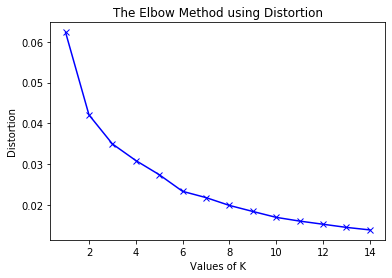

In [22]:
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,15) 

X= dfAllQueens[['Latitude','Longitude']].values

for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)

    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
    'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 

    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
    'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

Use the above data to find out the centroid of all the clusters

In [23]:

KMeans(init = "k-means++", n_init = 12)
kmean = KMeans().fit(X)
k_means_labels = kmean.labels_
k_means_labels
k_means_cluster_centers = kmean.cluster_centers_
k_means_cluster_centers

array([[ 40.74930197, -73.74843095],
       [ 40.7472903 , -73.87583437],
       [ 40.6990086 , -73.78199471],
       [ 40.69480181, -73.83848378],
       [ 40.75777838, -73.92208056],
       [ 40.76209743, -73.81995541],
       [ 40.62181961, -73.79402479],
       [ 40.70937954, -73.89892572]])

Plot the centroid found using Kmeans along with the Chinese restaurants in Queens to visually look at the data

In [ ]:
# Find out how many chinese restaurants are there near the centroids
# m = folium.Map([40.730610, -73.935242], zoom_start=11)
for index in k_means_cluster_centers:
        folium.CircleMarker(location=[index[0],index[1]],radius=10,color='blue').add_to(m)

for index, row in dfRestaurants.iterrows():
        if(row['CUISINE DESCRIPTION'])=='Chinese' and row['BORO']== 'Queens' :
            crest=[row["Latitude"], row["Longitude"]]
            for index in k_means_cluster_centers:
                cc=[index[0],index[1]]
                if geodesic(cc, crest).miles < 1:
                    folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=1,color='green').add_to(m)

m.add_child(plugins.HeatMap(dfAllQueens[['Latitude', 'Longitude']].values, radius=15))
m


Now we need to give the location of the centroids as the shortlisted places, with a high enough demand (as suggested by the Restaurant concentration), but also lesser availability of Chinese restarunats.

In [24]:
google_api_key='HIDDEN'

In [25]:
import requests

def get_address(api_key, latitude, longitude, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except Exception as e:
        print('Exception', e)
        return None

candidate_area_addresses = []
print('==============================================================')
print('Addresses of centers of areas recommended for further analysis')
print('==============================================================\n')
for lat, lon in k_means_cluster_centers:
    try:
        addr = get_address(google_api_key, lat, lon)
        candidate_area_addresses.append(addr)  
    except:
        print('Exception')
candidate_area_addresses

Addresses of centers of areas recommended for further analysis



['64-03 229th St, Flushing, NY 11364, USA',
 '40-71 Denman St, Flushing, NY 11373, USA',
 '108-31 173rd St, Jamaica, NY 11433, USA',
 '87-40 109th St, Jamaica, NY 11418, USA',
 '32-77 37th St, Long Island City, NY 11103, USA',
 '144-60 Roosevelt Ave, Flushing, NY 11354, USA',
 'Perimeter Rd, Jamaica, NY 11430, USA',
 '65-6 Fresh Pond Rd, Ridgewood, NY 11385, USA']

## Results and Discussion <a name="results"></a>

From our Analysis,
- We have been able to identify the Restaurant hotspots in Queens
- We have been able to identify and shortlist the areas where there are enough Restaurants, but there are not too many Chinese Restaurants

As a result of our analysis there are 8 areas which a potential restaurant owner can further explore on opening up of a Chinese Restaurants. The people in these areas have an habbit of eating out, and the market is not staurated with Chinese restaurants.

Further Analysis could be done on
- Parking availability
- Zoning Licenses and Liquor licenses
- Existing properties available


## Conclusion <a name="conclusion"></a>

This notebook could be used as a staring point for a potential restaurant owner to shortlist areas for opening a restaurant. Due to the extensive analysis and availability of the data, it will also become easier in case, the owner is not interested in opening a Chines Restaurant, but interested in looking at an alternate cusine. 

Since all the dataset used are publically available and also updated constantly, I hope that the work done remains relevant for some time to come.

# Appendix <a name="appendix"></a>

The appendix consists of all the experiments and exploration which were done during the project and is there only as a reference. Some of these explorations, led me to discard data sources, which I thought could be useful in the intial phase, but later found either alternate data sources or not used.


In [ ]:
dfBoroughs=pd.read_json('Borough Boundaries.geojson')
dfBoroughs = json_normalize(dfBoroughs['features']).rename(columns={"properties.boro_code": "code", "properties.boro_name": "name"})
dfBoroughs[['code','name']]

In [ ]:
dfBoroughs1 = json_normalize(dfBoroughs['features']) 
dfBoroughs1
# dfBoroughs1.sort_values('properties.boro_code')
# # dfBoroughs1.isnull().sum()
# dfBoroughs2=dfBoroughs1[['properties.boro_code','properties.boro_name']]

In [ ]:
dfBoroughs2.rename(columns={"properties.boro_code": "code", "properties.boro_name": "name"})

In [ ]:
dfnyco=pd.read_json('nyco.geojson')
dfnyco.head()
dfnyco1 = json_normalize(dfnyco['features']) 
dfnyco1

In [ ]:
dfParkingLots=pd.read_json('Parking Lots.geojson')
dfParkingLots.head()
dfParkingLots1 = json_normalize(dfParkingLots['features']) 
dfParkingLots1

In [ ]:
geo_json_data=json.load(open('Parking Lots.geojson'))
m = folium.Map([40.730610, -73.935242], zoom_start=11)
folium.GeoJson(geo_json_data).add_to(m)
display(m)

In [ ]:
# m = folium.Map([40.730610, -73.935242], zoom_start=11)
for index in k_means_cluster_centers:
        folium.CircleMarker(location=[index[0],index[1]],radius=10,color='blue').add_to(m)

for index, row in dfRestaurants.iterrows():
        if(row['CUISINE DESCRIPTION'])=='Chinese' and row['BORO']== 'Queens' :
            folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=1,color='green').add_to(m)
            
m.add_child(plugins.HeatMap(dfAllQueens[['Latitude', 'Longitude']].values, radius=15))
m

In [ ]:
geolocator = Nominatim(user_agent="IBM DS CAPSTONE")

for lat, lon in k_means_cluster_centers:
    location = geolocator.reverse(lat, lon)
    print(location.address)

In [ ]:
location = geolocator.geocode('162-10 Highland Ave, Jamaica, NY 11432, USA')
location.address

In [ ]:
print((location.latitude, location.longitude))

In [ ]:
location = geolocator.reverse(location.latitude, location.longitude)
location.address
